# DATA ANALYSIS AND VISUALIZATION

## I. Import thư viện

In [3]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as ps


## II. Thu thập dữ liệu

In [5]:
data = pd.read_csv('./data/processed_data.csv')
data.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,year,month,date,day,hour,time,total_revenue
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,2023,1,1,Sunday,7,morning,6.0
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,2023,1,1,Sunday,7,morning,6.2
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,2023,1,1,Sunday,7,morning,9.0
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,2023,1,1,Sunday,7,morning,2.0
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,2023,1,1,Sunday,7,morning,6.2


## III. Phân tích và trực quan hóa:

### 1. Tổng quan về thời gian:

#### - Doanh thu tổng cộng theo tháng-năm là bao nhiêu?

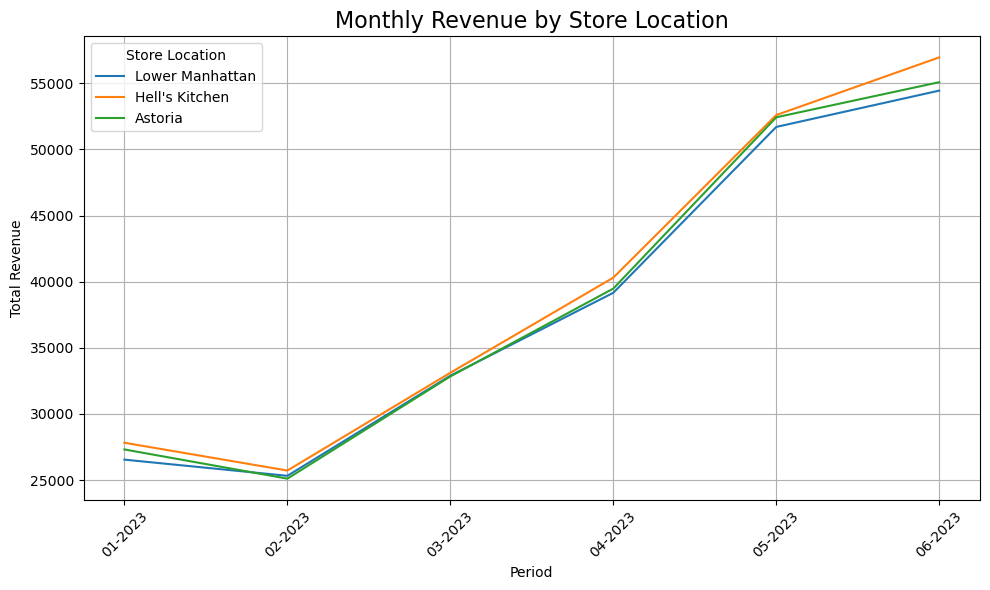

In [9]:
# Dữ liệu Lower Manhattan
monthly_revenue_lm = data[data['store_location'] == 'Lower Manhattan'].groupby(['month', 'year'])['total_revenue'].sum().reset_index()
monthly_revenue_lm['period'] = [f"{str(monthly_revenue_lm['month'][i]).zfill(2)}-{monthly_revenue_lm['year'][i]}" for i in range(monthly_revenue_lm.shape[0])]

# Dữ liệu Hell's Kitchen
monthly_revenue_hk = data[data['store_location'] == 'Hell\'s Kitchen'].groupby(['month', 'year'])['total_revenue'].sum().reset_index()
monthly_revenue_hk['period'] = [f"{str(monthly_revenue_hk['month'][i]).zfill(2)}-{monthly_revenue_hk['year'][i]}" for i in range(monthly_revenue_hk.shape[0])]

# Dữ liệu Astoria
monthly_revenue_at = data[data['store_location'] == 'Astoria'].groupby(['month', 'year'])['total_revenue'].sum().reset_index()
monthly_revenue_at['period'] = [f"{str(monthly_revenue_at['month'][i]).zfill(2)}-{monthly_revenue_at['year'][i]}" for i in range(monthly_revenue_at.shape[0])]

# Vẽ biểu đồ
plt.figure(figsize=(10, 6))

# Thêm từng đường vào biểu đồ
plt.plot(monthly_revenue_lm['period'], monthly_revenue_lm['total_revenue'], label="Lower Manhattan")
plt.plot(monthly_revenue_hk['period'], monthly_revenue_hk['total_revenue'], label="Hell's Kitchen")
plt.plot(monthly_revenue_at['period'], monthly_revenue_at['total_revenue'], label="Astoria")

# Thêm tiêu đề và nhãn
plt.title("Monthly Revenue by Store Location", fontsize=16)
plt.xlabel("Period")
plt.ylabel("Total Revenue")
plt.xticks(rotation=45)
plt.legend(title="Store Location")
plt.grid(True)

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


Nhận xét

#### - Lượng giao dịch có xu hướng tăng hay giảm theo thời gian?

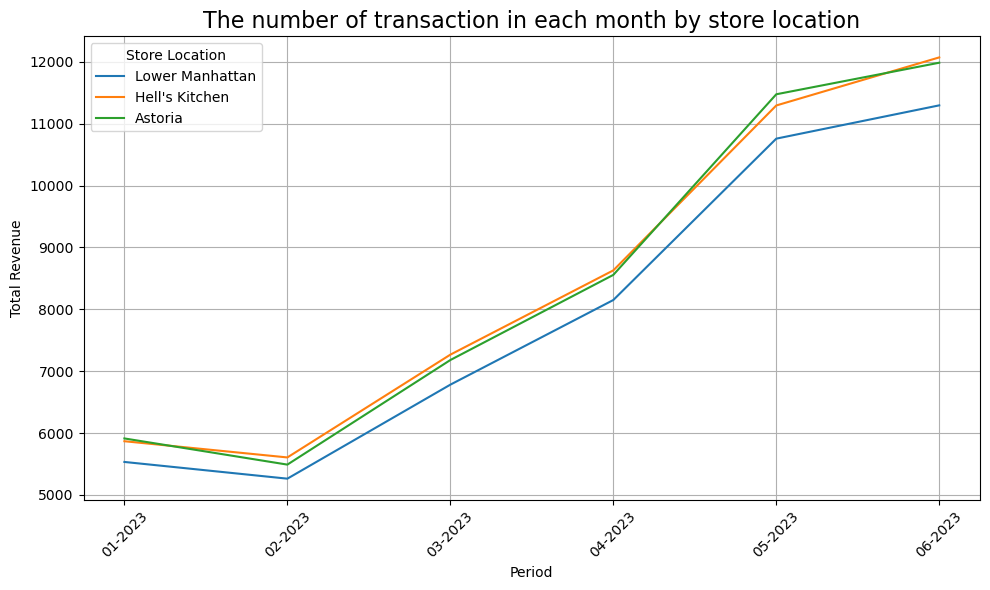

In [12]:
# Dữ liệu Lower Manhattan
monthly_transaction_lm = data[data['store_location'] == 'Lower Manhattan'].groupby(['month', 'year'])['transaction_id'].count().reset_index()
monthly_transaction_lm['period'] = [f"{str(monthly_transaction_lm['month'][i]).zfill(2)}-{monthly_transaction_lm['year'][i]}" for i in range(monthly_transaction_lm.shape[0])]

# Dữ liệu Hell's Kitchen
monthly_transaction_hk = data[data['store_location'] == 'Hell\'s Kitchen'].groupby(['month', 'year'])['transaction_id'].count().reset_index()
monthly_transaction_hk['period'] = [f"{str(monthly_transaction_hk['month'][i]).zfill(2)}-{monthly_transaction_hk['year'][i]}" for i in range(monthly_transaction_hk.shape[0])]

# Dữ liệu Astoria
monthly_transaction_at = data[data['store_location'] == 'Astoria'].groupby(['month', 'year'])['transaction_id'].count().reset_index()
monthly_transaction_at['period'] = [f"{str(monthly_transaction_at['month'][i]).zfill(2)}-{monthly_transaction_at['year'][i]}" for i in range(monthly_transaction_at.shape[0])]

# Vẽ biểu đồ
plt.figure(figsize=(10, 6))

# Thêm từng đường vào biểu đồ
plt.plot(monthly_transaction_lm['period'], monthly_transaction_lm['transaction_id'], label="Lower Manhattan")
plt.plot(monthly_transaction_hk['period'], monthly_transaction_hk['transaction_id'], label="Hell's Kitchen")
plt.plot(monthly_transaction_at['period'], monthly_transaction_at['transaction_id'], label="Astoria")

# Thêm tiêu đề và nhãn
plt.title("The number of transaction in each month by store location", fontsize=16)
plt.xlabel("Period")
plt.ylabel("Total Revenue")
plt.xticks(rotation=45)
plt.legend(title="Store Location")
plt.grid(True)

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


Nhận xét

#### - Liệu rằng cuối tuần sẽ có doanh thu cao hơn các ngày trong tuần?

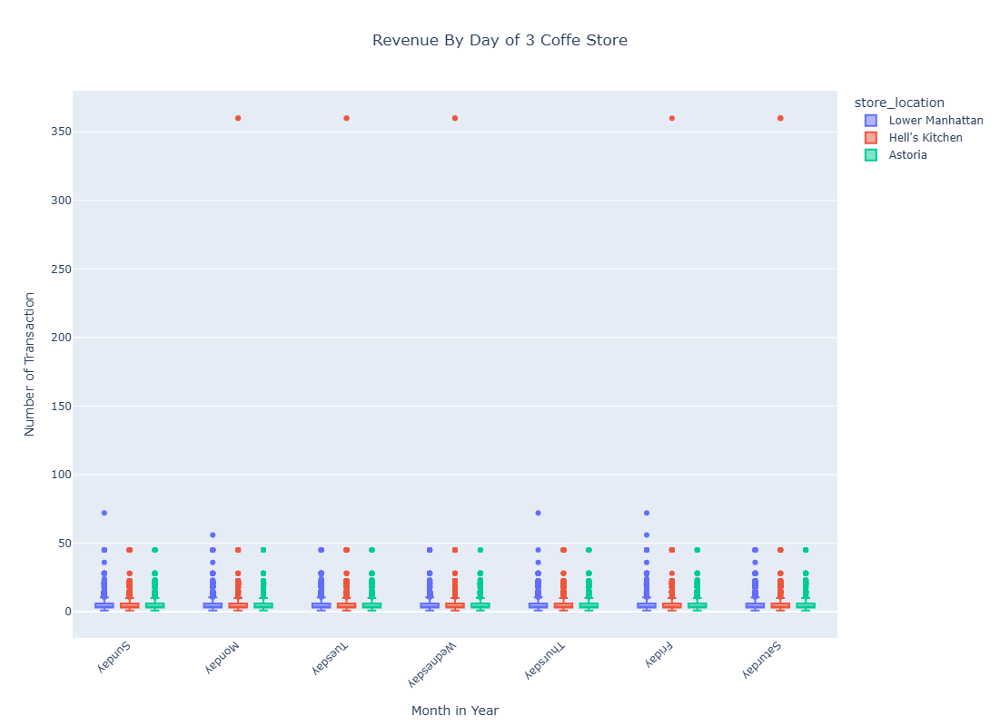

In [51]:
fig = px.box(data, x="day", y="total_revenue", color = 'store_location', notched=True, title="Revenue By Day of 3 Coffe Store")
# Cập nhật giao diện biểu đồ
fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},  # Căn giữa tiêu đề
    xaxis_title="Month in Year",  # Nhãn trục x
    yaxis_title="Number of Transaction",  # Nhãn trục y
    xaxis=dict(
        tickformat="%b %Y",  # Định dạng nhãn tháng-năm (ví dụ: Jan 2023)
        tickangle=135  # Xoay nhãn trục x
    ),
    height=800,  # Chỉnh chiều cao của biểu đồ
    width=1100,  # Chỉnh chiều rộng của biểu đồ
)
fig.show()

Nhận xét

### 3. Phân tích chi tiết

#### - Cửa hàng nào tạo ra doanh thu cao nhất?

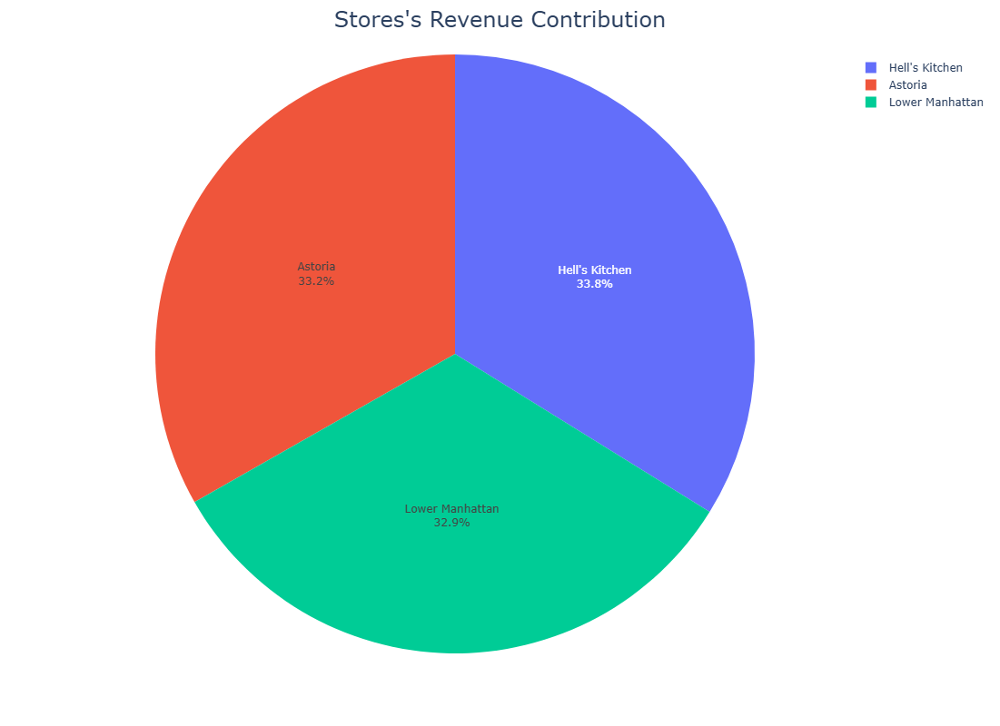

In [19]:
revenue_by_store = data.groupby('store_location')['total_revenue'].sum().reset_index()
# Vẽ biểu đồ tròn với plotly.express
fig = px.pie(
    revenue_by_store,
    values='total_revenue',
    names='store_location'
)
fig.update_traces(textinfo='percent+label')
# Căn giữa tiêu đề và làm biểu đồ to hơn
fig.update_layout(
    title=dict(
        text='Stores\'s Revenue Contribution',
        x=0.5,  # Căn giữa tiêu đề (giá trị từ 0 đến 1)
        xanchor='center',  # Cố định vị trí
        font=dict(size=24)  # Tăng kích thước font
    ),
    width=800,  # Tăng chiều rộng biểu đồ
    height=800,  # Tăng chiều cao biểu đồ
)

fig.update_traces(textinfo='percent+label')
fig.show()

Nhận xét:

#### - Sản phẩm nào bán chạy theo khung giờ trong ngày?

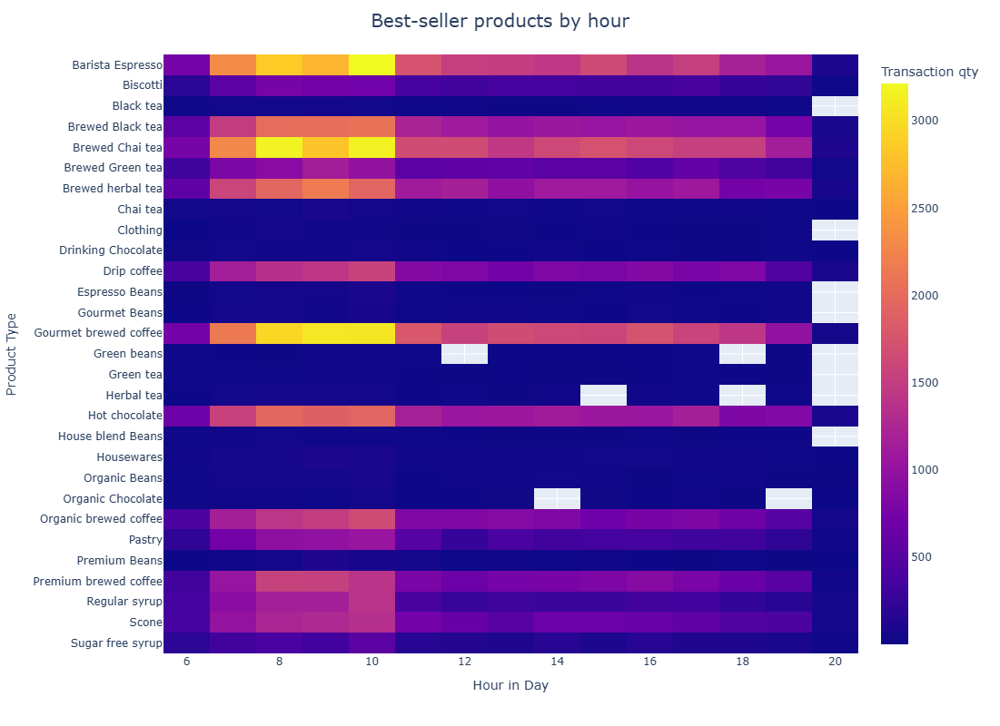

In [47]:
product_by_hour = data.groupby(['hour', 'product_type'])['transaction_qty'].sum()
product_by_hour = product_by_hour.unstack(0)
fig = px.imshow(product_by_hour.values, labels=dict(x="Hour in Day", y="Product Type", color='Transaction qty'),
              x=product_by_hour.columns, y=product_by_hour.index)
fig.update_xaxes(side="bottom")
fig.update_layout(
    title="Best-seller products by hour",
    title_x=0.5,  # Căn giữa tiêu đề
    title_font=dict(size=20),
    height=800,  # Chỉnh chiều cao của biểu đồ
    width=1100,  # Chỉnh chiều rộng của biểu đồ
    showlegend=False
)
fig.show()

Nhận xét:

#### - Giá sản phẩm có ảnh hưởng đến số lượng bán ra không?

In [25]:

fig = px.scatter(data, x="unit_price", y="transaction_qty", color="product_type")
fig.update_layout(
    title=dict(
        text='The number of transaction of products.',
        x=0.5,  # Căn giữa tiêu đề (giá trị từ 0 đến 1)
        xanchor='center',  # Cố định vị trí
        font=dict(size=24)  # Tăng kích thước font
    ),
    width=1000,  # Tăng chiều rộng biểu đồ
    height=800,  # Tăng chiều cao biểu đồ
)
fig.show()

Nhận xét:

#### - Khung giờ nào trong ngày sẽ có lượng giao dịch cao nhất?

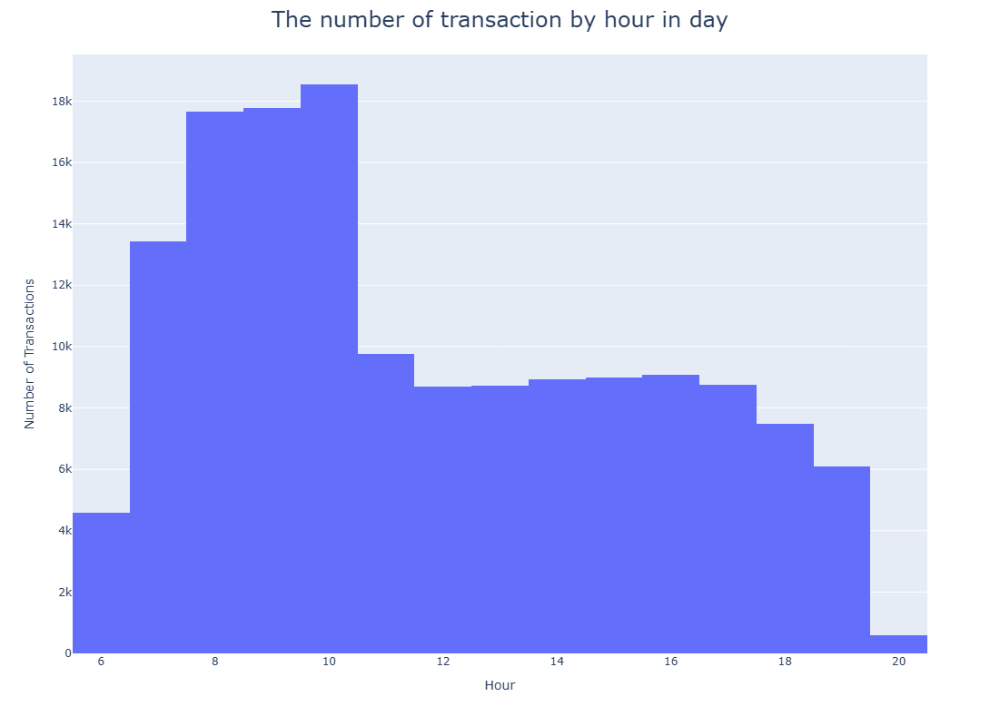

In [53]:
fig = px.histogram(data, x='hour', nbins=15, labels={'hour': 'Hour'})
fig.update_layout(
    title=dict(
        text='The number of transaction by hour in day',
        x=0.5,  # Căn giữa tiêu đề (giá trị từ 0 đến 1)
        xanchor='center',  # Cố định vị trí
        font=dict(size=24)  # Tăng kích thước font
    ),
    yaxis_title='Number of Transactions',
    height=800,  # Chỉnh chiều cao của biểu đồ
    width=1100,  # Chỉnh chiều rộng của biểu đồ
)

fig.show()

Nhận xét:

#### - Liệu có sự khác nhau về số lượng giao dịch cao nhất theo khung giờ giữa ngày trong tuần và ngày cuối tuần?

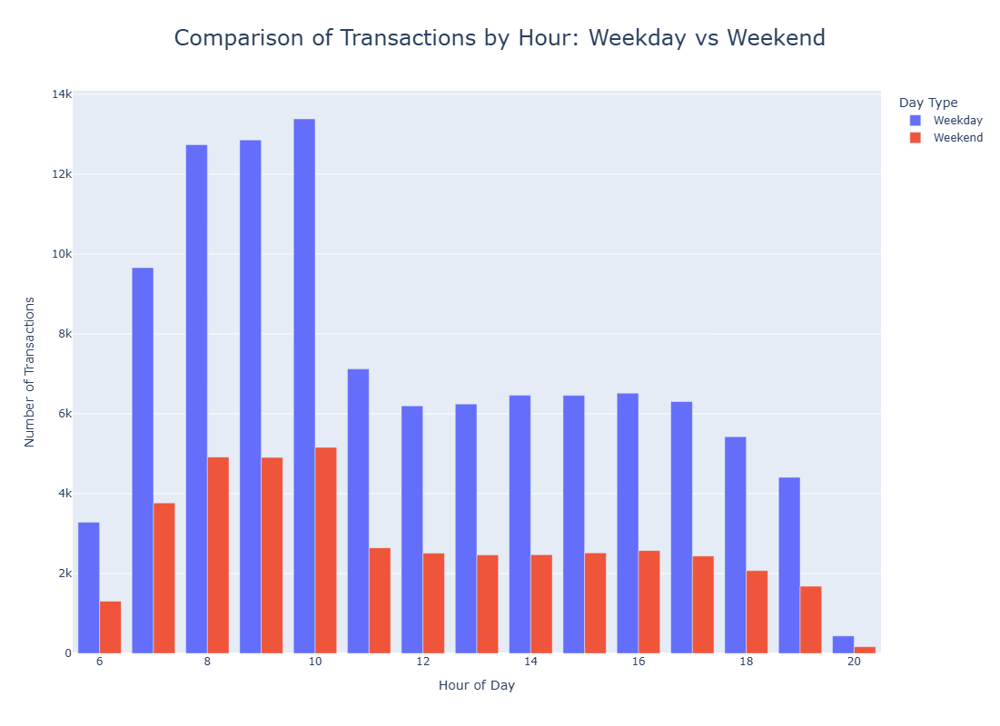

In [61]:
tmp = data.copy()
tmp['day_type'] = ['Weekday' if tmp['day'][i] in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] else 'Weekend' for i in range(tmp.shape[0])]
weekly_transaction = tmp.groupby(['hour', 'day_type'])['transaction_id'].count().reset_index()
fig = px.bar(
    weekly_transaction,
    x='hour',
    y='transaction_id',
    color='day_type',  # Cột phân loại weekday/weekend
    barmode='group',
    labels={'hour': 'Hour of Day', 'transaction_id': 'Number of Transactions', 'day_type': 'Day Type'},
    title='Comparison of Transactions by Hour: Weekday vs Weekend'
)
fig.update_layout(
    title=dict(
        x=0.5,  # Căn giữa tiêu đề (giá trị từ 0 đến 1)
        xanchor='center',  # Cố định vị trí
        font=dict(size=24)  # Tăng kích thước font
    ),
    height=800,  # Chỉnh chiều cao của biểu đồ
    width=1100,  # Chỉnh chiều rộng của biểu đồ
)

fig.show()

Nhận xét: